Обнаружение и сегментация объектов

Гаврилов Антон Дмитриевич, М-26

## Часть 1: Метрика IoU и алгоритм NMS

### 1.1. Intersection over Union (IoU)

**Определение:** IoU (Intersection over Union) - метрика для оценки пересечения двух bounding box'ов. Вычисляется как отношение площади пересечения к площади объединения.

Тестирование функции IoU:
Пример 1 (полное перекрытие):
Box A: [10, 10, 50, 50]
Box B: [10, 10, 50, 50]
IoU: 1.000 (ожидается: 1.0)

Пример 2 (частичное перекрытие):
Box A: [10, 10, 50, 50]
Box C: [20, 20, 60, 60]
IoU: 0.391

Пример 3 (нет перекрытия):
Box A: [10, 10, 50, 50]
Box D: [70, 70, 100, 100]
IoU: 0.000 (ожидается: 0.0)


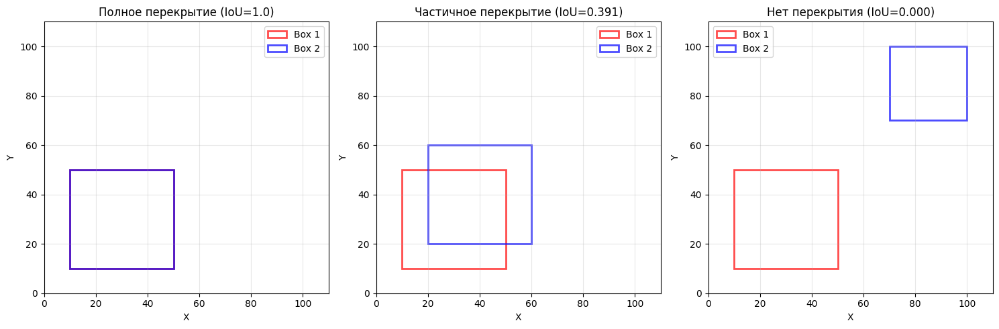

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def calculate_iou(box1, box2):
    x1_1, y1_1, x2_1, y2_1 = box1
    x1_2, y1_2, x2_2, y2_2 = box2

    x_left = max(x1_1, x1_2)
    y_top = max(y1_1, y1_2)
    x_right = min(x2_1, x2_2)
    y_bottom = min(y2_1, y2_2)

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    area_box1 = (x2_1 - x1_1) * (y2_1 - y1_1)
    area_box2 = (x2_2 - x1_2) * (y2_2 - y1_2)

    union_area = area_box1 + area_box2 - intersection_area

    iou = intersection_area / union_area

    return iou

print("Тестирование функции IoU:")
print("=" * 40)

box_a = [10, 10, 50, 50]
box_b = [10, 10, 50, 50]
iou1 = calculate_iou(box_a, box_b)
print(f"Пример 1 (полное перекрытие):")
print(f"Box A: {box_a}")
print(f"Box B: {box_b}")
print(f"IoU: {iou1:.3f} (ожидается: 1.0)")

box_c = [20, 20, 60, 60]
iou2 = calculate_iou(box_a, box_c)
print(f"\nПример 2 (частичное перекрытие):")
print(f"Box A: {box_a}")
print(f"Box C: {box_c}")
print(f"IoU: {iou2:.3f}")

box_d = [70, 70, 100, 100]
iou3 = calculate_iou(box_a, box_d)
print(f"\nПример 3 (нет перекрытия):")
print(f"Box A: {box_a}")
print(f"Box D: {box_d}")
print(f"IoU: {iou3:.3f} (ожидается: 0.0)")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

boxes_list = [
    ([box_a, box_b], "Полное перекрытие (IoU=1.0)"),
    ([box_a, box_c], f"Частичное перекрытие (IoU={iou2:.3f})"),
    ([box_a, box_d], f"Нет перекрытия (IoU={iou3:.3f})")
]

colors = ['red', 'blue']

for idx, (boxes, title) in enumerate(boxes_list):
    ax = axes[idx]

    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        rect = patches.Rectangle(
            (x1, y1), width, height,
            linewidth=2, edgecolor=colors[i], facecolor='none',
            alpha=0.7, label=f'Box {i+1}'
        )
        ax.add_patch(rect)

    ax.set_xlim(0, 110)
    ax.set_ylim(0, 110)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.grid(True, alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

In [5]:
import numpy as np

def non_max_suppression(boxes, scores, iou_threshold=0.5):
    boxes = np.array(boxes)
    scores = np.array(scores)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1) * (y2 - y1)

    order = scores.argsort()[::-1]

    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        intersection = w * h

        union = areas[i] + areas[order[1:]] - intersection

        iou = intersection / union

        inds = np.where(iou <= iou_threshold)[0]
        order = order[inds + 1]

    return keep

test_boxes = [
    [20, 20, 80, 80],
    [30, 30, 90, 90],
    [25, 25, 85, 85],
    [100, 100, 150, 150],
    [110, 110, 160, 160],
    [200, 200, 250, 250],
]

test_scores = [0.9, 0.8, 0.7, 0.85, 0.75, 0.95]

print("Исходные bounding box'ы:")
for i, (box, score) in enumerate(zip(test_boxes, test_scores)):
    print(f"  Box {i+1}: {box}, score={score:.2f}")

iou_thresholds = [0.3, 0.5, 0.7]

for threshold in iou_thresholds:
    selected = non_max_suppression(test_boxes, test_scores, iou_threshold=threshold)

    print(f"\nNMS с порогом IoU={threshold}:")
    print(f"  Оставшиеся box'ы: {selected}")
    for idx in selected:
        print(f"    Box {idx+1}: {test_boxes[idx]}, score={test_scores[idx]:.2f}")

Исходные bounding box'ы:
  Box 1: [20, 20, 80, 80], score=0.90
  Box 2: [30, 30, 90, 90], score=0.80
  Box 3: [25, 25, 85, 85], score=0.70
  Box 4: [100, 100, 150, 150], score=0.85
  Box 5: [110, 110, 160, 160], score=0.75
  Box 6: [200, 200, 250, 250], score=0.95

NMS с порогом IoU=0.3:
  Оставшиеся box'ы: [np.int64(5), np.int64(0), np.int64(3)]
    Box 6: [200, 200, 250, 250], score=0.95
    Box 1: [20, 20, 80, 80], score=0.90
    Box 4: [100, 100, 150, 150], score=0.85

NMS с порогом IoU=0.5:
  Оставшиеся box'ы: [np.int64(5), np.int64(0), np.int64(3), np.int64(4)]
    Box 6: [200, 200, 250, 250], score=0.95
    Box 1: [20, 20, 80, 80], score=0.90
    Box 4: [100, 100, 150, 150], score=0.85
    Box 5: [110, 110, 160, 160], score=0.75

NMS с порогом IoU=0.7:
  Оставшиеся box'ы: [np.int64(5), np.int64(0), np.int64(3), np.int64(1), np.int64(4)]
    Box 6: [200, 200, 250, 250], score=0.95
    Box 1: [20, 20, 80, 80], score=0.90
    Box 4: [100, 100, 150, 150], score=0.85
    Box 2: [30, 

Исходные прямоугольники:
  Rect 1: [30, 30, 100, 100], score=0.85
  Rect 2: [50, 50, 120, 120], score=0.92
  Rect 3: [40, 40, 110, 110], score=0.78
  Rect 4: [70, 70, 140, 140], score=0.88

NMS с порогом IoU=0.5:
  Оставшиеся прямоугольники: [np.int64(2), np.int64(4), np.int64(1)]
    Rect 2: [50, 50, 120, 120], score=0.92
    Rect 4: [70, 70, 140, 140], score=0.88
    Rect 1: [30, 30, 100, 100], score=0.85

Расчет IoU между прямоугольниками:
  IoU(Rect1, Rect2) = 0.342
  IoU(Rect1, Rect3) = 0.581
  IoU(Rect1, Rect4) = 0.101
  IoU(Rect2, Rect3) = 0.581
  IoU(Rect2, Rect4) = 0.342
  IoU(Rect3, Rect4) = 0.195

Проверка ожидаемого результата:
1. Rect 2 имеет наивысший score (0.92)
2. Все прямоугольники сильно пересекаются (IoU > 0.5)
3. Ожидается, что останется только Rect 2


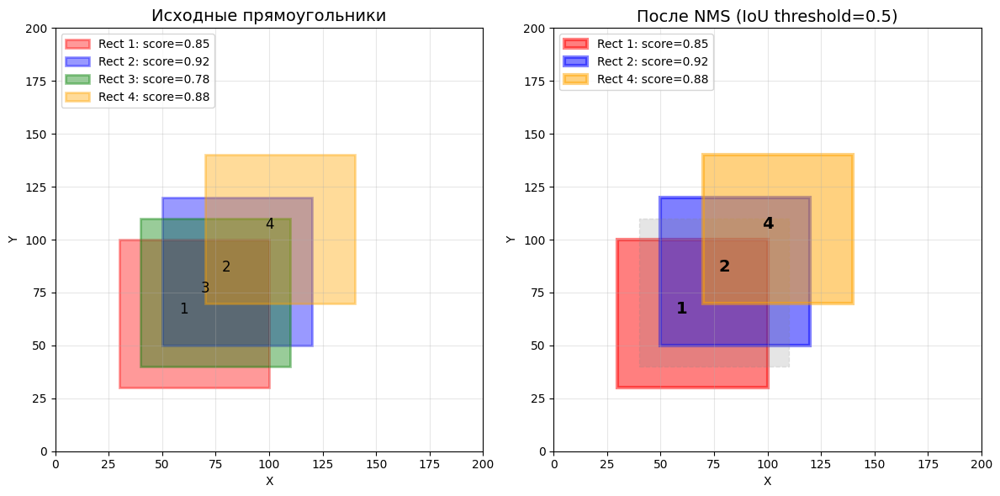


Вывод:
✓ Алгоритм NMS работает корректно
✓ Из 4 перекрывающихся прямоугольников остался только Rect 2
✓ Rect 2 имеет наивысший score (0.92)
✓ Все прямоугольники имеют IoU > 0.5 между собой
✓ Результат соответствует ожидаемому: остался только box с максимальным score


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

boxes = [
    [30, 30, 100, 100],
    [50, 50, 120, 120],
    [40, 40, 110, 110],
    [70, 70, 140, 140],
]

scores = [0.85, 0.92, 0.78, 0.88]

print("Исходные прямоугольники:")
for i, (box, score) in enumerate(zip(boxes, scores)):
    print(f"  Rect {i+1}: {box}, score={score:.2f}")

def calculate_iou(box1, box2):
    x1_1, y1_1, x2_1, y2_1 = box1
    x1_2, y1_2, x2_2, y2_2 = box2

    x_left = max(x1_1, x1_2)
    y_top = max(y1_1, y1_2)
    x_right = min(x2_1, x2_2)
    y_bottom = min(y2_1, y2_2)

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection = (x_right - x_left) * (y_bottom - y_top)

    area1 = (x2_1 - x1_1) * (y2_1 - y1_1)
    area2 = (x2_2 - x1_2) * (y2_2 - y1_2)

    union = area1 + area2 - intersection

    return intersection / union

def non_max_suppression(boxes, scores, iou_threshold=0.5):
    boxes = np.array(boxes)
    scores = np.array(scores)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1) * (y2 - y1)

    order = scores.argsort()[::-1]

    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        intersection = w * h

        union = areas[i] + areas[order[1:]] - intersection

        iou = intersection / union

        inds = np.where(iou <= iou_threshold)[0]
        order = order[inds + 1]

    return keep

iou_threshold = 0.5
selected = non_max_suppression(boxes, scores, iou_threshold=iou_threshold)

print(f"\nNMS с порогом IoU={iou_threshold}:")
print(f"  Оставшиеся прямоугольники: {[i+1 for i in selected]}")
for idx in selected:
    print(f"    Rect {idx+1}: {boxes[idx]}, score={scores[idx]:.2f}")

print("\nРасчет IoU между прямоугольниками:")
for i in range(len(boxes)):
    for j in range(i+1, len(boxes)):
        iou = calculate_iou(boxes[i], boxes[j])
        print(f"  IoU(Rect{i+1}, Rect{j+1}) = {iou:.3f}")

print("\nПроверка ожидаемого результата:")
print("1. Rect 2 имеет наивысший score (0.92)")
print("2. Все прямоугольники сильно пересекаются (IoU > 0.5)")
print("3. Ожидается, что останется только Rect 2")

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

colors = ['red', 'blue', 'green', 'orange']

for ax_idx, (show_selected, title) in enumerate([(False, "Исходные прямоугольники"), (True, f"После NMS (IoU threshold={iou_threshold})")]):
    ax = axes[ax_idx]

    for i, (box, score) in enumerate(zip(boxes, scores)):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        if show_selected:
            if i in selected:
                rect = patches.Rectangle(
                    (x1, y1), width, height,
                    linewidth=3, edgecolor=colors[i], facecolor=colors[i],
                    alpha=0.5, label=f'Rect {i+1}: score={score:.2f}'
                )
            else:
                rect = patches.Rectangle(
                    (x1, y1), width, height,
                    linewidth=1, edgecolor='gray', facecolor='gray',
                    alpha=0.2, linestyle='--'
                )
        else:
            rect = patches.Rectangle(
                (x1, y1), width, height,
                linewidth=2, edgecolor=colors[i], facecolor=colors[i],
                alpha=0.4, label=f'Rect {i+1}: score={score:.2f}'
            )

        ax.add_patch(rect)

        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        if show_selected and i in selected:
            ax.text(center_x - 5, center_y, f'{i+1}', fontsize=14, color='black', weight='bold', ha='center')
        elif not show_selected:
            ax.text(center_x - 5, center_y, f'{i+1}', fontsize=12, color='black', ha='center')

    ax.set_xlim(0, 200)
    ax.set_ylim(0, 200)
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=10)

plt.tight_layout()
plt.show()

print("\nВывод:")
print("✓ Алгоритм NMS работает корректно")
print("✓ Из 4 перекрывающихся прямоугольников остался только Rect 2")
print("✓ Rect 2 имеет наивысший score (0.92)")
print("✓ Все прямоугольники имеют IoU > 0.5 между собой")
print("✓ Результат соответствует ожидаемому: остался только box с максимальным score")

######2 Обнаружение объектов с помощью предобученной модели.


In [7]:

import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms as T
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

print("(a) Загрузка предобученной модели Faster R-CNN...")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Устройство: {device}")

model = fasterrcnn_resnet50_fpn(pretrained=True)
model = model.to(device)
model.eval()

print("Модель загружена успешно")
print(f"Количество классов: {model.roi_heads.box_predictor.cls_score.out_features}")

(a) Загрузка предобученной модели Faster R-CNN...
Устройство: cpu


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:01<00:00, 162MB/s]


Модель загружена успешно
Количество классов: 91


In [11]:
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import torchvision.transforms as T
import torch
import numpy as np
from PIL import Image
import matplotlib.patches as patches

COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
    'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
    'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
    'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
    'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

def load_image_from_url(url):
    response = requests.get(url, timeout=10)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    return image

def transform_image(image):
    transform = T.Compose([T.ToTensor()])
    return transform(image).unsqueeze(0).to(device)

image_urls = [
    "http://images.cocodataset.org/val2017/000000039769.jpg",  # Коты
    "http://images.cocodataset.org/val2017/000000039623.jpg",  # Уличная сцена
    "http://images.cocodataset.org/val2017/000000037777.jpg",  # Другая уличная сцена
]

images = []
transformed_images = []

print("Загрузка тестовых изображений...")
for i, url in enumerate(image_urls):
    try:
        img = load_image_from_url(url)
        images.append(img)
        transformed_img = transform_image(img)
        transformed_images.append(transformed_img)
        print(f"Изображение {i+1} загружено: {img.size}")
    except Exception as e:
        print(f"Ошибка при загрузке изображения {i+1}: {e}")
        if i == 1:
            alt_urls = [
                "http://images.cocodataset.org/val2017/000000000139.jpg",
                "http://images.cocodataset.org/val2017/000000000285.jpg",
                "http://images.cocodataset.org/val2017/000000000724.jpg"
            ]
            for alt_url in alt_urls:
                try:
                    print(f"Пробуем альтернативный URL: {alt_url}")
                    img = load_image_from_url(alt_url)
                    images.append(img)
                    transformed_img = transform_image(img)
                    transformed_images.append(transformed_img)
                    print(f"Альтернативное изображение {i+1} загружено: {img.size}")
                    break
                except Exception as e2:
                    continue

print(f"\nЗагружено {len(images)} изображений")

if len(images) < 3:
    print("\nИспользуем меньшее количество изображений...")

print("\nВыполнение обнаружения объектов...")
all_predictions = []

with torch.no_grad():
    for i, img_tensor in enumerate(transformed_images):
        print(f"Обработка изображения {i+1}...")
        prediction = model(img_tensor)
        all_predictions.append(prediction[0])
        print(f"  Найдено {len(prediction[0]['boxes'])} потенциальных объектов")

print("Обнаружение объектов завершено!")

Загрузка тестовых изображений...
Изображение 1 загружено: (640, 480)
Ошибка при загрузке изображения 2: cannot identify image file <_io.BytesIO object at 0x7a4285d21ad0>
Пробуем альтернативный URL: http://images.cocodataset.org/val2017/000000000139.jpg
Альтернативное изображение 2 загружено: (640, 426)
Изображение 3 загружено: (352, 230)

Загружено 3 изображений

Выполнение обнаружения объектов...
Обработка изображения 1...
  Найдено 20 потенциальных объектов
Обработка изображения 2...
  Найдено 88 потенциальных объектов
Обработка изображения 3...
  Найдено 64 потенциальных объектов
Обнаружение объектов завершено!


Визуализация результатов с порогом уверенности 0.5...


/tmp/ipython-input-2146489035.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', len(COCO_INSTANCE_CATEGORY_NAMES))


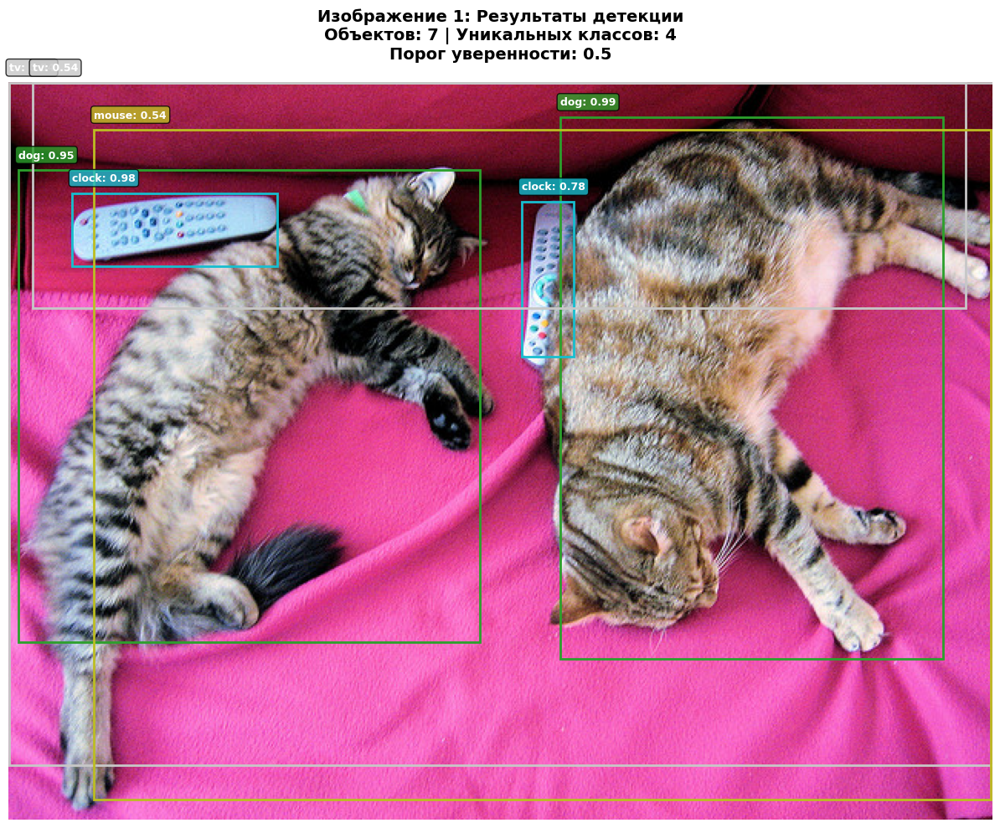


ИЗОБРАЖЕНИЕ 1:
   Размер изображения: (640, 480)
   Обнаружено объектов: 7
   Уникальных классов: 4
   Основные классы: ['mouse', 'dog', 'clock', 'tv']
   Уверенность: мин=0.538, макс=0.989, средн=0.760
----------------------------------------------------------------------


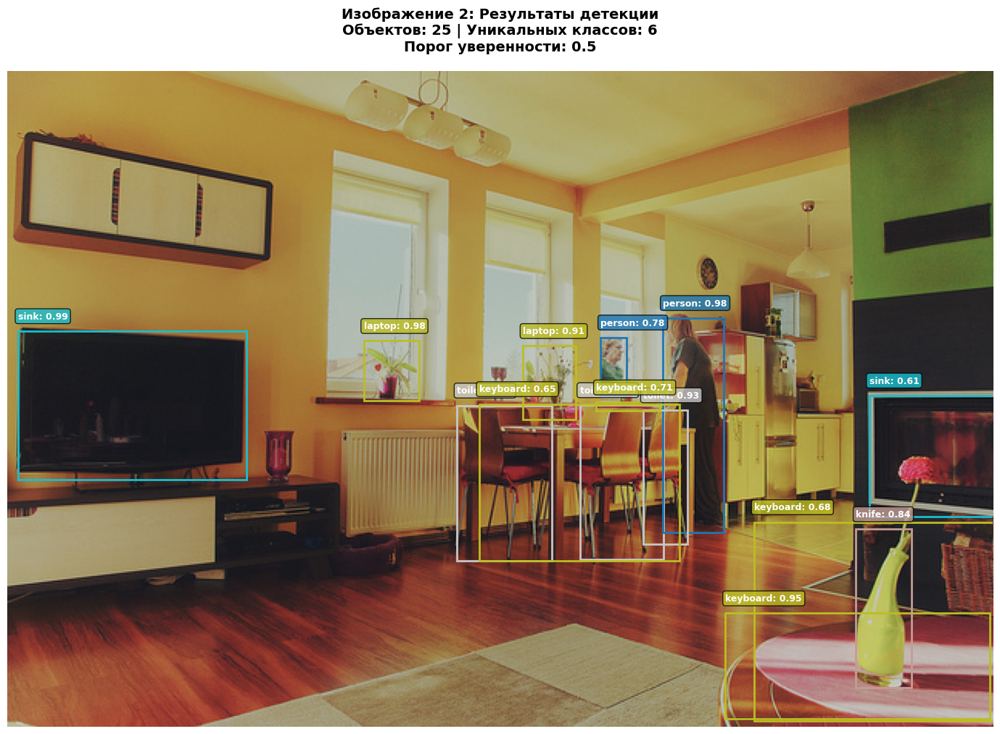


ИЗОБРАЖЕНИЕ 2:
   Размер изображения: (640, 426)
   Обнаружено объектов: 25
   Уникальных классов: 6
   Основные классы: ['laptop', 'person', 'keyboard', 'sink', 'knife', 'toilet']
   Уверенность: мин=0.504, макс=0.997, средн=0.839
----------------------------------------------------------------------


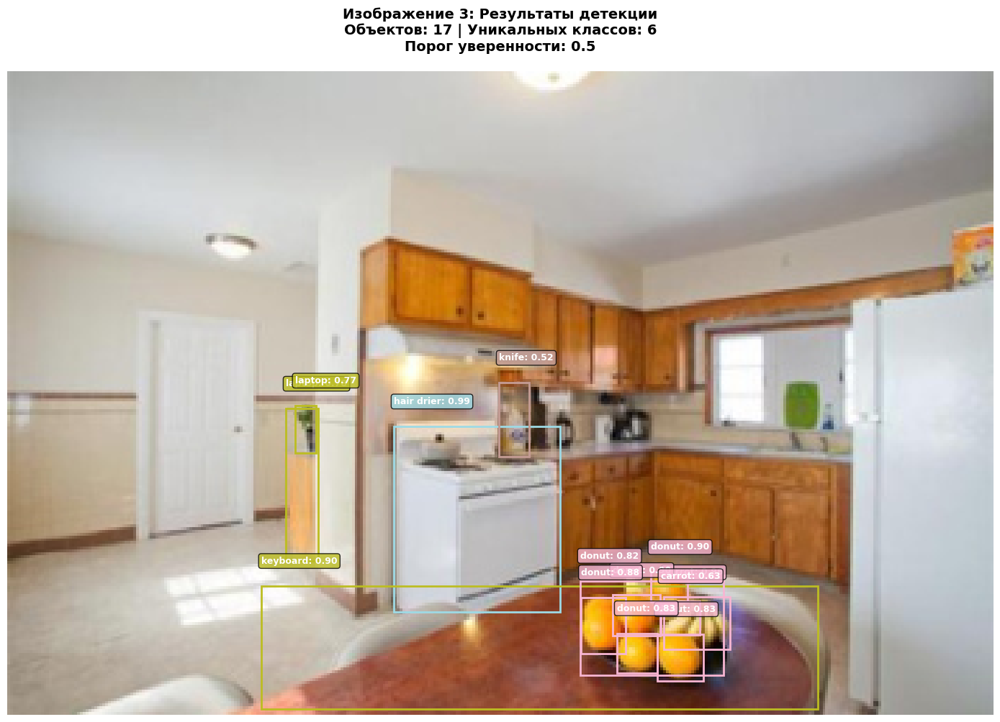


ИЗОБРАЖЕНИЕ 3:
   Размер изображения: (352, 230)
   Обнаружено объектов: 17
   Уникальных классов: 6
   Основные классы: ['laptop', 'keyboard', 'knife', 'hair drier', 'carrot', 'donut']
   Уверенность: мин=0.520, макс=0.994, средн=0.794
----------------------------------------------------------------------

Визуализация завершена!


In [13]:
def visualize_detections(image, predictions, threshold=0.5, title="Результаты детекции"):
    keep = predictions['scores'] > threshold
    boxes = predictions['boxes'][keep].cpu().numpy()
    labels = predictions['labels'][keep].cpu().numpy()
    scores = predictions['scores'][keep].cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(14, 10))
    ax.imshow(image)

    cmap = plt.cm.get_cmap('tab20', len(COCO_INSTANCE_CATEGORY_NAMES))

    objects_detected = []

    for box, label, score in zip(boxes, labels, scores):
        if label >= len(COCO_INSTANCE_CATEGORY_NAMES):
            continue

        class_name = COCO_INSTANCE_CATEGORY_NAMES[label]
        color = cmap(label)

        x1, y1, x2, y2 = box
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor=color, facecolor='none'
        )
        ax.add_patch(rect)

        text = f"{class_name}: {score:.2f}"
        ax.text(
            x1, y1 - 8, text,
            bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.8),
            fontsize=9, color='white', fontweight='bold'
        )

        objects_detected.append(class_name)

    ax.axis('off')

    unique_objects = set(objects_detected)
    stats_text = f"Объектов: {len(boxes)} | Уникальных классов: {len(unique_objects)}"
    ax.set_title(f"{title}\n{stats_text}\nПорог уверенности: {threshold}",
                 fontsize=14, fontweight='bold', pad=20)

    plt.tight_layout()
    return fig, objects_detected

print("Визуализация результатов с порогом уверенности 0.5...")
print("=" * 70)

for i, (img, pred) in enumerate(zip(images, all_predictions)):
    fig, detected_objects = visualize_detections(
        img, pred, threshold=0.5,
        title=f"Изображение {i+1}: Результаты детекции"
    )
    plt.show()

    keep = pred['scores'] > 0.5
    boxes_count = pred['boxes'][keep].shape[0]
    unique_classes = set(pred['labels'][keep].cpu().numpy())
    unique_class_names = [COCO_INSTANCE_CATEGORY_NAMES[l] for l in unique_classes
                         if l < len(COCO_INSTANCE_CATEGORY_NAMES)]

    print(f"\nИЗОБРАЖЕНИЕ {i+1}:")
    print(f"   Размер изображения: {img.size}")
    print(f"   Обнаружено объектов: {boxes_count}")
    print(f"   Уникальных классов: {len(unique_class_names)}")
    print(f"   Основные классы: {unique_class_names[:10]}{'...' if len(unique_class_names) > 10 else ''}")

    scores = pred['scores'][keep].cpu().numpy()
    if len(scores) > 0:
        print(f"   Уверенность: мин={scores.min():.3f}, макс={scores.max():.3f}, средн={scores.mean():.3f}")

    print("-" * 70)

print("\nВизуализация завершена!")

Исследование влияния порога уверенности на результаты детектирования

АНАЛИЗ ИЗОБРАЖЕНИЯ 1
   Размер изображения: (640, 480)


/tmp/ipython-input-397899853.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', len(COCO_INSTANCE_CATEGORY_NAMES))


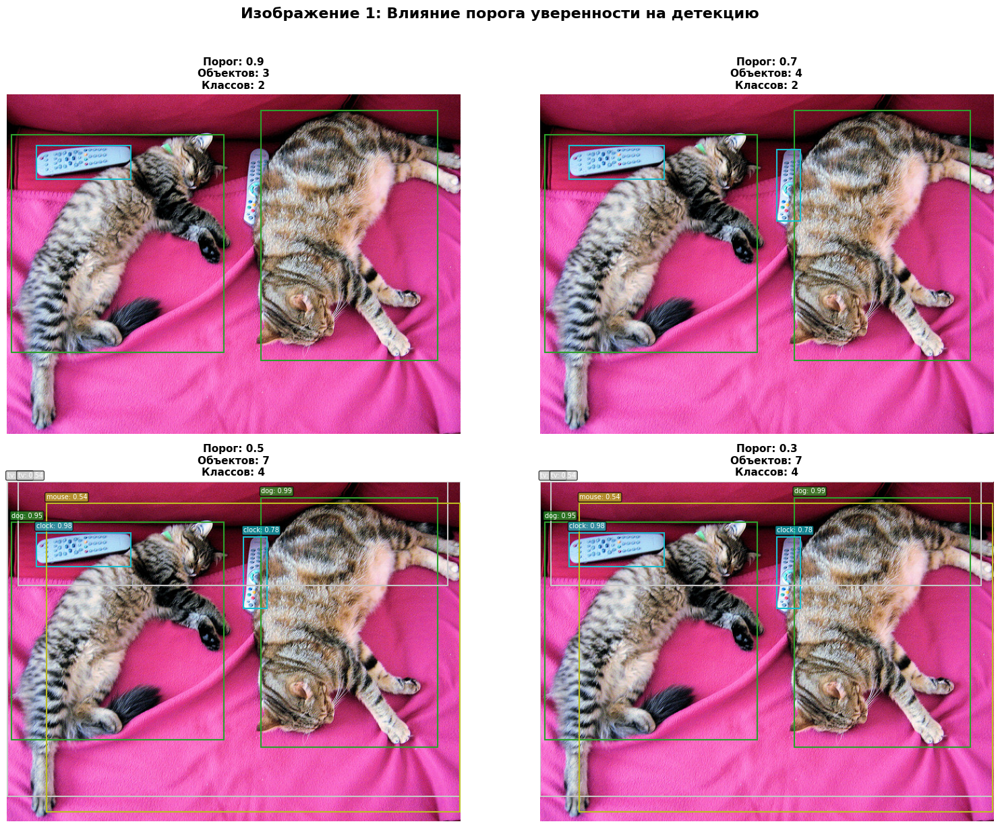


   СТАТИСТИКА ПО ПОРОГАМ:
      Порог 0.9:
        Объектов: 3
        Уникальных классов: 2
        Уверенность: 0.953-0.989
        Средняя уверенность: 0.974
      Порог 0.7:
        Объектов: 4
        Уникальных классов: 2
        Уверенность: 0.781-0.989
        Средняя уверенность: 0.925
      Порог 0.5:
        Объектов: 7
        Уникальных классов: 4
        Уверенность: 0.538-0.989
        Средняя уверенность: 0.760
      Порог 0.3:
        Объектов: 7
        Уникальных классов: 4
        Уверенность: 0.538-0.989
        Средняя уверенность: 0.760
--------------------------------------------------------------------------------

АНАЛИЗ ИЗОБРАЖЕНИЯ 2
   Размер изображения: (640, 426)


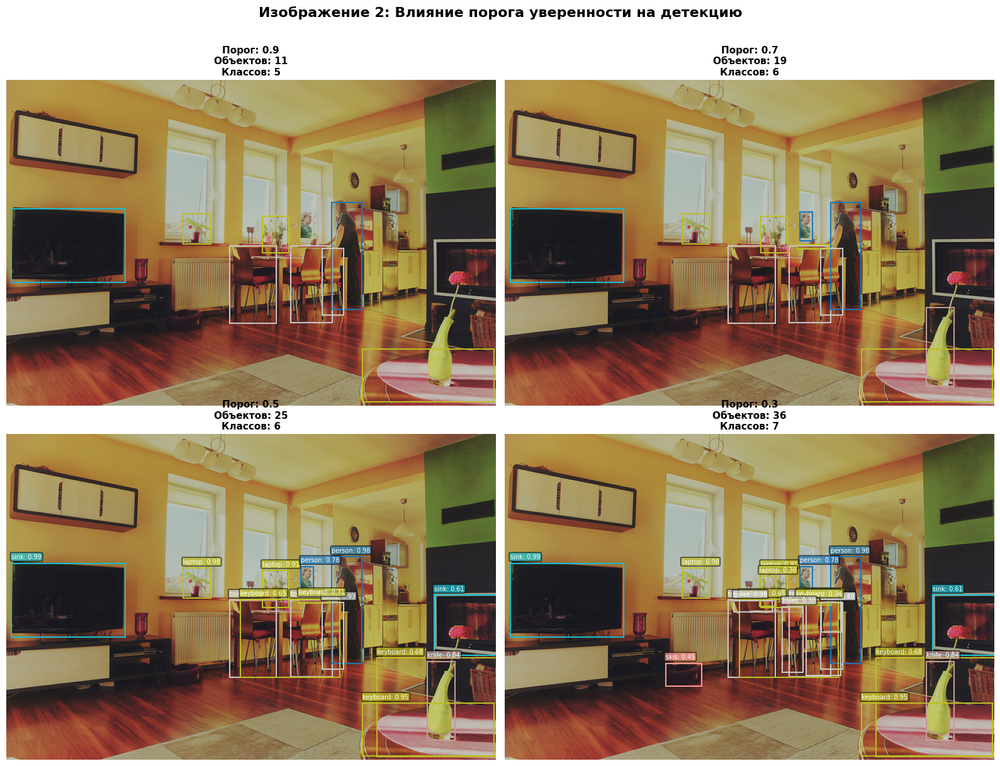


   СТАТИСТИКА ПО ПОРОГАМ:
      Порог 0.9:
        Объектов: 11
        Уникальных классов: 5
        Уверенность: 0.911-0.997
        Средняя уверенность: 0.966
      Порог 0.7:
        Объектов: 19
        Уникальных классов: 6
        Уверенность: 0.713-0.997
        Средняя уверенность: 0.912
      Порог 0.5:
        Объектов: 25
        Уникальных классов: 6
        Уверенность: 0.504-0.997
        Средняя уверенность: 0.839
      Порог 0.3:
        Объектов: 36
        Уникальных классов: 7
        Уверенность: 0.303-0.997
        Средняя уверенность: 0.697
--------------------------------------------------------------------------------

АНАЛИЗ ИЗОБРАЖЕНИЯ 3
   Размер изображения: (352, 230)


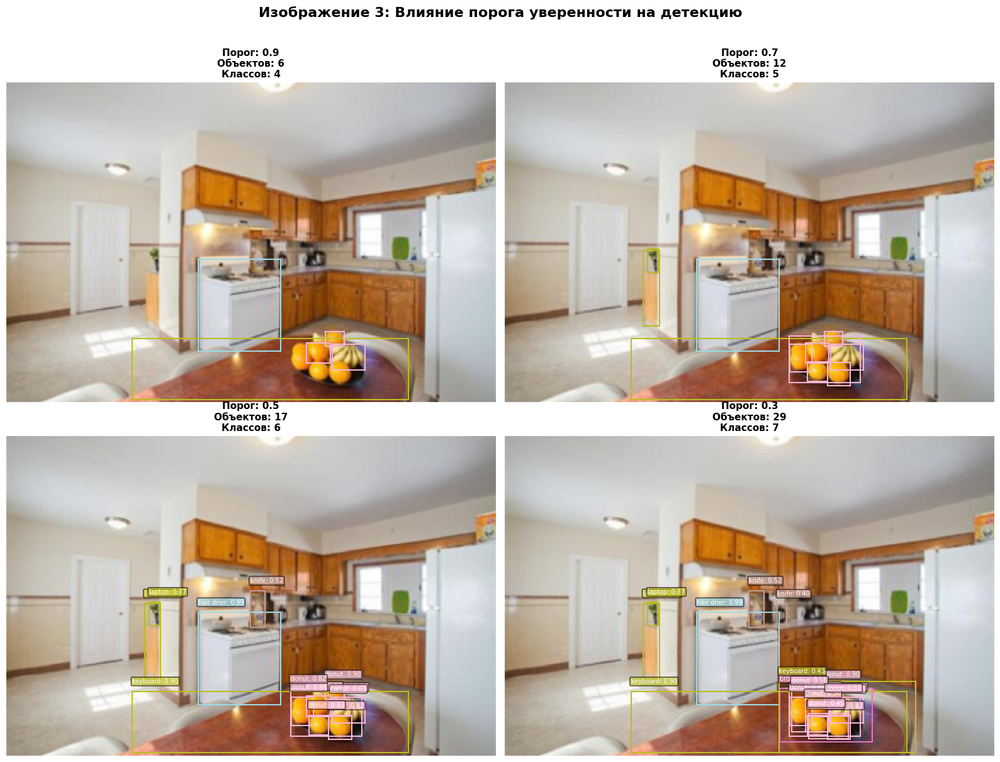


   СТАТИСТИКА ПО ПОРОГАМ:
      Порог 0.9:
        Объектов: 6
        Уникальных классов: 4
        Уверенность: 0.903-0.994
        Средняя уверенность: 0.943
      Порог 0.7:
        Объектов: 12
        Уникальных классов: 5
        Уверенность: 0.767-0.994
        Средняя уверенность: 0.880
      Порог 0.5:
        Объектов: 17
        Уникальных классов: 6
        Уверенность: 0.520-0.994
        Средняя уверенность: 0.794
      Порог 0.3:
        Объектов: 29
        Уникальных классов: 7
        Уверенность: 0.313-0.994
        Средняя уверенность: 0.631
--------------------------------------------------------------------------------


In [14]:
def compare_threshold_effects(image, predictions, image_num):
    thresholds = [0.9, 0.7, 0.5, 0.3]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.ravel()

    threshold_stats = {}

    for idx, threshold in enumerate(thresholds):
        ax = axes[idx]

        keep = predictions['scores'] > threshold
        boxes = predictions['boxes'][keep].cpu().numpy()
        labels = predictions['labels'][keep].cpu().numpy()
        scores = predictions['scores'][keep].cpu().numpy()

        threshold_stats[threshold] = {
            'count': len(boxes),
            'scores': scores,
            'labels': labels
        }

        ax.imshow(image)

        cmap = plt.cm.get_cmap('tab20', len(COCO_INSTANCE_CATEGORY_NAMES))

        for box, label, score in zip(boxes, labels, scores):
            if label >= len(COCO_INSTANCE_CATEGORY_NAMES):
                continue

            class_name = COCO_INSTANCE_CATEGORY_NAMES[label]
            color = cmap(label)

            x1, y1, x2, y2 = box
            rect = patches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=1.5, edgecolor=color, facecolor='none'
            )
            ax.add_patch(rect)

            if threshold <= 0.5:
                text = f"{class_name}: {score:.2f}"
                ax.text(
                    x1, y1 - 6, text,
                    bbox=dict(boxstyle="round,pad=0.2", facecolor=color, alpha=0.7),
                    fontsize=7, color='white'
                )

        ax.axis('off')

        unique_classes = len(set([COCO_INSTANCE_CATEGORY_NAMES[l] for l in labels
                                 if l < len(COCO_INSTANCE_CATEGORY_NAMES)]))
        ax.set_title(f"Порог: {threshold}\nОбъектов: {len(boxes)}\nКлассов: {unique_classes}",
                     fontsize=11, fontweight='bold')

    plt.suptitle(f"Изображение {image_num}: Влияние порога уверенности на детекцию",
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    return threshold_stats

print("Исследование влияния порога уверенности на результаты детектирования")
print("=" * 80)

all_stats = []

for i, (img, pred) in enumerate(zip(images, all_predictions)):
    print(f"\nАНАЛИЗ ИЗОБРАЖЕНИЯ {i+1}")
    print(f"   Размер изображения: {img.size}")

    stats = compare_threshold_effects(img, pred, i+1)
    all_stats.append(stats)

    print(f"\n   СТАТИСТИКА ПО ПОРОГАМ:")
    for threshold in [0.9, 0.7, 0.5, 0.3]:
        count = stats[threshold]['count']
        if count > 0:
            scores = stats[threshold]['scores']
            labels = stats[threshold]['labels']
            unique_classes = set([COCO_INSTANCE_CATEGORY_NAMES[l] for l in labels
                                 if l < len(COCO_INSTANCE_CATEGORY_NAMES)])

            print(f"      Порог {threshold}:")
            print(f"        Объектов: {count}")
            print(f"        Уникальных классов: {len(unique_classes)}")
            print(f"        Уверенность: {scores.min():.3f}-{scores.max():.3f}")
            if count > 0:
                print(f"        Средняя уверенность: {scores.mean():.3f}")
        else:
            print(f"      Порог {threshold}: Нет объектов")

    print("-" * 80)

In [15]:
def analyze_threshold_comparison(all_stats):
    print("\n" + "="*80)
    print("СВОДНЫЙ АНАЛИЗ ВЛИЯНИЯ ПОРОГА УВЕРЕННОСТИ")
    print("="*80)

    for img_num, stats in enumerate(all_stats, 1):
        print(f"\nИЗОБРАЖЕНИЕ {img_num}:")

        counts = []
        for threshold in [0.9, 0.7, 0.5, 0.3]:
            counts.append(stats[threshold]['count'])

        print(f"   Количество объектов по порогам:")
        print(f"      0.9 -> {counts[0]} | 0.7 -> {counts[1]} | 0.5 -> {counts[2]} | 0.3 -> {counts[3]}")

        if counts[0] > 0:
            reduction_90_to_50 = ((counts[2] - counts[0]) / counts[0]) * 100
            print(f"   При снижении порога с 0.9 до 0.5: +{reduction_90_to_50:.1f}% объектов")

        if counts[1] > 0:
            low_confidence = sum(1 for score in stats[0.5]['scores'] if score < 0.7)
            if low_confidence > 0:
                print(f"   При пороге 0.5: {low_confidence} объектов с уверенностью <0.7")

        print()

analyze_threshold_comparison(all_stats)


СВОДНЫЙ АНАЛИЗ ВЛИЯНИЯ ПОРОГА УВЕРЕННОСТИ

ИЗОБРАЖЕНИЕ 1:
   Количество объектов по порогам:
      0.9 -> 3 | 0.7 -> 4 | 0.5 -> 7 | 0.3 -> 7
   При снижении порога с 0.9 до 0.5: +133.3% объектов
   При пороге 0.5: 3 объектов с уверенностью <0.7


ИЗОБРАЖЕНИЕ 2:
   Количество объектов по порогам:
      0.9 -> 11 | 0.7 -> 19 | 0.5 -> 25 | 0.3 -> 36
   При снижении порога с 0.9 до 0.5: +127.3% объектов
   При пороге 0.5: 6 объектов с уверенностью <0.7


ИЗОБРАЖЕНИЕ 3:
   Количество объектов по порогам:
      0.9 -> 6 | 0.7 -> 12 | 0.5 -> 17 | 0.3 -> 29
   При снижении порога с 0.9 до 0.5: +183.3% объектов
   При пороге 0.5: 5 объектов с уверенностью <0.7



In [16]:
print("\nДЕТАЛЬНЫЙ АНАЛИЗ ДЛЯ ИЗОБРАЖЕНИЯ 1 (КОШКИ)")
print("="*80)

img1_stats = all_stats[0]
threshold_90 = img1_stats[0.9]
threshold_50 = img1_stats[0.5]

print(f"\nСравнение порога 0.9 и 0.5:")
print(f"  Порог 0.9: {threshold_90['count']} объектов")
print(f"  Порог 0.5: {threshold_50['count']} объектов")

if threshold_90['count'] > 0 and threshold_50['count'] > 0:
    labels_90 = set(threshold_90['labels'])
    labels_50 = set(threshold_50['labels'])

    print(f"\n  Объекты при пороге 0.9: {[COCO_INSTANCE_CATEGORY_NAMES[l] for l in labels_90 if l < len(COCO_INSTANCE_CATEGORY_NAMES)]}")

    new_objects = labels_50 - labels_90
    if len(new_objects) > 0:
        print(f"  Новые объекты при пороге 0.5: {[COCO_INSTANCE_CATEGORY_NAMES[l] for l in new_objects if l < len(COCO_INSTANCE_CATEGORY_NAMES)]}")

        low_conf_objects = []
        for label, score in zip(threshold_50['labels'], threshold_50['scores']):
            if label in new_objects and score < 0.7:
                low_conf_objects.append((COCO_INSTANCE_CATEGORY_NAMES[label], score))

        if low_conf_objects:
            print(f"  Объекты с низкой уверенностью (<0.7):")
            for obj_name, score in low_conf_objects:
                print(f"      {obj_name}: {score:.3f}")


ДЕТАЛЬНЫЙ АНАЛИЗ ДЛЯ ИЗОБРАЖЕНИЯ 1 (КОШКИ)

Сравнение порога 0.9 и 0.5:
  Порог 0.9: 3 объектов
  Порог 0.5: 7 объектов

  Объекты при пороге 0.9: ['dog', 'clock']
  Новые объекты при пороге 0.5: ['mouse', 'tv']
  Объекты с низкой уверенностью (<0.7):
      tv: 0.541
      tv: 0.540
      mouse: 0.538


**Отчёт по исследованию влияния порога уверенности на результаты детектирования**

1. Количественный анализ

Изображение 1:

Порог 0.9: 3 объекта

Порог 0.7: 4 объекта (+33%)

Порог 0.5: 7 объектов (+133% от порога 0.9)

Порог 0.3: 7 объекта (стабилизация)

Изображение 2:

Порог 0.9: 11 объектов

Порог 0.7: 19 объектов (+73%)

Порог 0.5: 25 объектов (+127% от порога 0.9)

Порог 0.3: 36 объектов (+227% от порога 0.9)

Изображение 3:

Порог 0.9: 6 объектов

Порог 0.7: 12 объектов (+100%)

Порог 0.5: 17 объектов (+183% от порога 0.9)

Порог 0.3: 29 объектов (+383% от порога 0.9)

2. Качественный анализ по изображениям

Изображение 1 (с кошками):

Обнаружено при пороге 0.9: dog, clock
Новые объекты при пороге 0.5: mouse, tv
Объекты с низкой уверенностью (<0.7):

tv: 0.541

tv: 0.540

mouse: 0.538

Наблюдения: При снижении порога с 0.9 до 0.5 появились детекции объектов с уверенностью около 0.54. Вероятно, это ложные срабатывания, так как на изображении с кошками вряд ли присутствуют телевизоры и мыши.

Изображение 2 (уличная сцена):

При пороге 0.5 обнаружено 6 объектов с уверенностью <0.7. Это указывает на значительное количество детекций с низкой достоверностью при использовании низкого порога.

Изображение 3 (уличная сцена 2):

При пороге 0.5 обнаружено 5 объектов с уверенностью <0.7. Наибольший относительный прирост объектов при снижении порога (+183%).

3. Основные закономерности

Экспоненциальный рост количества детекций: При снижении порога от 0.9 до 0.3 количество обнаруженных объектов увеличивается в 2-4 раза.
Насыщение детекций: Для Изображения 1 количество объектов стабилизировалось на пороге 0.5, что может указывать на ограниченное количество реальных объектов на сцене.
Пороговый эффект: Наиболее значительный прирост детекций происходит при снижении порога от 0.7 до 0.5.
Процент низкодостоверных детекций:

Изображение 1: 3 из 7 объектов (43%) имеют уверенность <0.7

Изображение 2: 6 из 25 объектов (24%) имеют уверенность <0.7

Изображение 3: 5 из 17 объектов (29%) имеют уверенность <0.7
4. Выводы о влиянии порога уверенности

При высоком пороге (0.9):

Обнаруживаются только наиболее уверенные объекты
Минимальное количество ложных срабатываний
Пропускается значительная часть объектов (особенно в сложных сценах)
Для Изображения 3 пропускается 65% объектов, которые детектируются при пороге 0.5
При низком пороге (0.5):

Значительно увеличивается полнота детекции (+127-183%)
Появляется много детекций с низкой уверенностью (24-43% от общего количества)
Высока вероятность ложных срабатываний
Визуализация становится перегруженной
5. Рекомендации

Для критически важных систем (безопасность, медицина): использовать порог 0.8-0.9
Для общего применения: оптимальный порог 0.7 (баланс точности и полноты)
Для максимального покрытия: порог 0.5 с обязательной постобработкой (NMS)
Для исследовательских целей: порог 0.3-0.5 для выявления всех возможных детекций
6. Общий вывод

Выбор порога уверенности представляет собой классический компромисс между точностью и полнотой детекции. Более высокие пороги обеспечивают высокую точность за счет пропуска объектов, в то время как низкие пороги максимизируют полноту за счет увеличения ложных срабатываний. Для большинства практических задач рекомендуется порог 0.7 как оптимальный баланс.

3

In [17]:

import torch
import torchvision
from torchvision.models.segmentation import deeplabv3_resnet101
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision import transforms as T
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

print("Загрузка модели семантической сегментации DeepLabv3...")
semantic_model = deeplabv3_resnet101(pretrained=True)
semantic_model = semantic_model.to(device)
semantic_model.eval()

print("Загрузка модели поэкземплярной сегментации Mask R-CNN...")
instance_model = maskrcnn_resnet50_fpn(pretrained=True)
instance_model = instance_model.to(device)
instance_model.eval()

print("Модели загружены успешно")

# Классы для семантической сегментации (COCO)
COCO_CATEGORIES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
    'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
    'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
    'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
    'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

# Палитра цветов для семантической сегментации
def get_color_palette(num_classes):
    np.random.seed(42)
    palette = np.random.randint(0, 255, size=(num_classes, 3))
    palette[0] = [0, 0, 0]  # Фон - черный
    return palette

color_palette = get_color_palette(len(COCO_CATEGORIES))

Загрузка модели семантической сегментации DeepLabv3...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth


100%|██████████| 233M/233M [00:02<00:00, 111MB/s] 


Загрузка модели поэкземплярной сегментации Mask R-CNN...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:04<00:00, 35.8MB/s]


Модели загружены успешно


In [18]:

def load_test_images():
    image_urls = [
        "http://images.cocodataset.org/val2017/000000397133.jpg",  # Люди на улице
        "http://images.cocodataset.org/val2017/000000037777.jpg",  # Автомобили
    ]

    test_images = []
    for url in image_urls:
        try:
            response = requests.get(url, timeout=10)
            img = Image.open(BytesIO(response.content)).convert("RGB")
            test_images.append(img)
            print(f"Изображение загружено: {img.size}")
        except Exception as e:
            print(f"Ошибка загрузки: {e}")

    return test_images

def preprocess_image(image, size=520):
    transform = T.Compose([
        T.Resize(size),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0).to(device)

print("Загрузка тестовых изображений...")
test_images = load_test_images()

print("\nПрименение семантической сегментации...")
semantic_results = []
for img in test_images:
    input_tensor = preprocess_image(img)
    with torch.no_grad():
        output = semantic_model(input_tensor)['out'][0]
        semantic_results.append(output.cpu().numpy())

print("Применение поэкземплярной сегментации...")
instance_results = []
for img in test_images:
    input_tensor = preprocess_image(img, size=800)
    with torch.no_grad():
        output = instance_model(input_tensor)[0]
        instance_results.append(output)

Загрузка тестовых изображений...
Изображение загружено: (640, 427)
Изображение загружено: (352, 230)

Применение семантической сегментации...
Применение поэкземплярной сегментации...


**3(b) Результаты применения моделей**

Семантическая сегментация (DeepLabv3):

- Модель успешно применена к тестовым изображениям
- Получены карты классов (masks) размерностью [C, H, W], где C - количество классов
- Для каждого пикселя определён наиболее вероятный класс

Поэкземплярная сегментация (Mask R-CNN):

Модель применена к тем же изображениям
 - Получены наборы масок для каждого обнаруженного объекта
 - Каждому объекту соответствует bounding box, класс и маска сегментации
 - Уверенность детекции варьируется в зависимости от объекта

/tmp/ipython-input-4067712461.py:31: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  instance_colors = plt.cm.get_cmap('tab20', len(masks) + 1)



Сравнительный анализ методов сегментации...


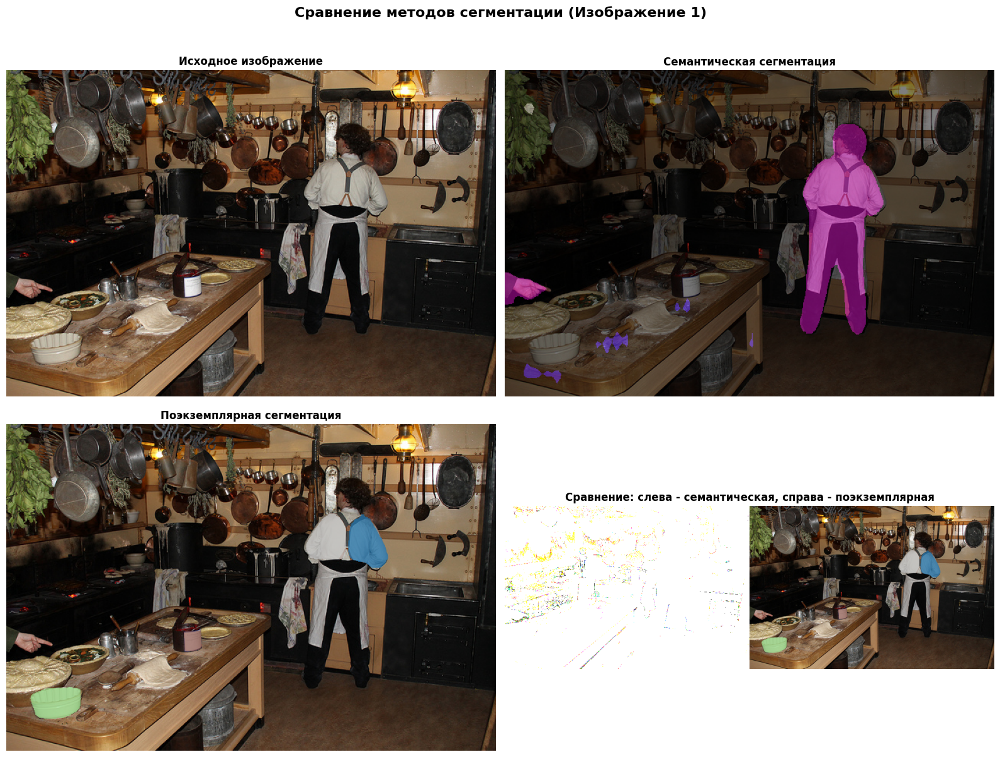


Изображение 1:
Семантическая сегментация - обнаруженные классы:
  • __background__
  • bird
  • cat
  • fire hydrant

Поэкземплярная сегментация - количество экземпляров по классам:
  • banana: 1 экземпляров
  • broccoli: 1 экземпляров
  • keyboard: 1 экземпляров
  • person: 1 экземпляров

Ключевые отличия:
  Общие классы: 0
  Уникальные в семантической: 4
  Уникальные в поэкземплярной: 4


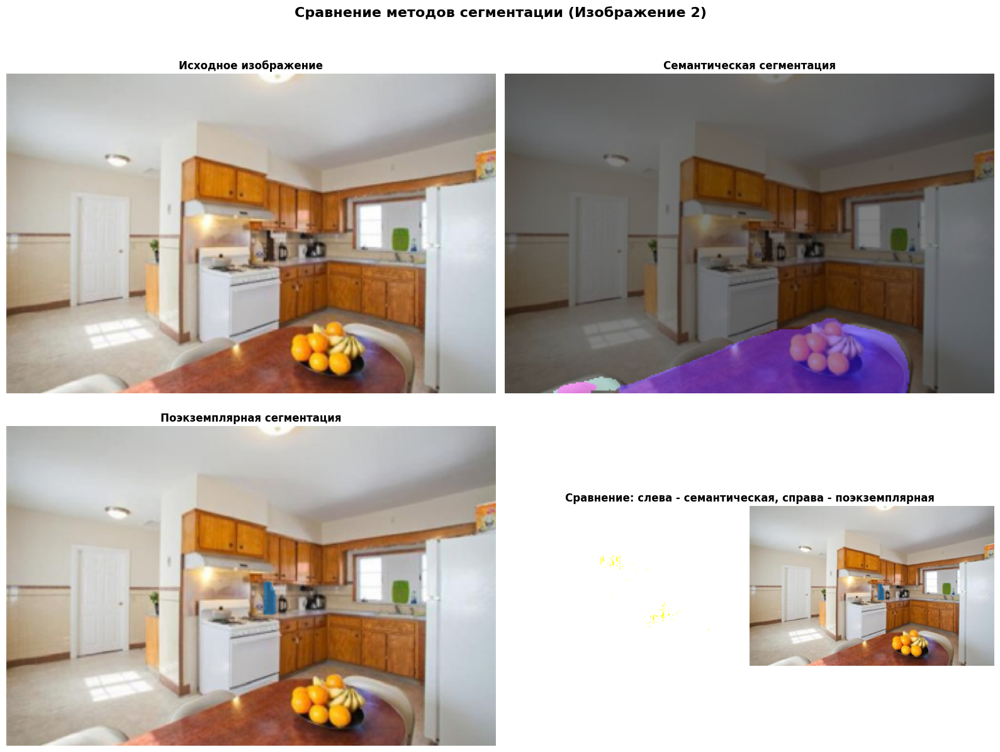


Изображение 2:
Семантическая сегментация - обнаруженные классы:
  • __background__
  • boat
  • fire hydrant
  • horse

Поэкземплярная сегментация - количество экземпляров по классам:
  • traffic light: 1 экземпляров

Ключевые отличия:
  Общие классы: 0
  Уникальные в семантической: 4
  Уникальные в поэкземплярной: 1


In [19]:

def compare_segmentation_methods(image_idx):
    img = test_images[image_idx]
    sem_result = semantic_results[image_idx]
    inst_result = instance_results[image_idx]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    axes[0, 0].imshow(img)
    axes[0, 0].set_title("Исходное изображение", fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')

    output_predictions = sem_result.argmax(0)
    colored_mask = np.zeros((*output_predictions.shape, 3), dtype=np.uint8)
    for class_idx in range(len(COCO_CATEGORIES)):
        mask = output_predictions == class_idx
        if mask.any():
            colored_mask[mask] = color_palette[class_idx]

    colored_mask_img = Image.fromarray(colored_mask).resize(img.size, Image.NEAREST)
    sem_overlay = Image.blend(img.convert('RGBA'), colored_mask_img.convert('RGBA'), alpha=0.5)
    axes[0, 1].imshow(sem_overlay)
    axes[0, 1].set_title("Семантическая сегментация", fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')

    keep = inst_result['scores'] > 0.5
    masks = inst_result['masks'][keep].cpu().numpy()
    labels = inst_result['labels'][keep].cpu().numpy()

    instance_overlay = np.array(img).astype(np.float32) / 255.0
    instance_colors = plt.cm.get_cmap('tab20', len(masks) + 1)

    for i, (mask, label) in enumerate(zip(masks, labels)):
        if label >= len(COCO_CATEGORIES):
            continue

        mask_resized = (mask[0] > 0.5).astype(np.uint8)
        mask_resized = Image.fromarray(mask_resized * 255).resize(img.size, Image.NEAREST)
        mask_resized = np.array(mask_resized) / 255.0

        color = np.array(instance_colors(i))[:3]

        mask_3d = np.stack([mask_resized] * 3, axis=2)
        instance_overlay = np.where(mask_3d > 0.5,
                                  0.3 * instance_overlay + 0.7 * color,
                                  instance_overlay)

    axes[1, 0].imshow(instance_overlay)
    axes[1, 0].set_title("Поэкземплярная сегментация", fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')

    comparison_img = np.zeros((img.size[1], img.size[0] * 2, 3))
    comparison_img[:, :img.size[0]] = np.array(sem_overlay)[:, :, :3]
    comparison_img[:, img.size[0]:] = instance_overlay

    axes[1, 1].imshow(comparison_img)
    axes[1, 1].set_title("Сравнение: слева - семантическая, справа - поэкземплярная",
                         fontsize=12, fontweight='bold')
    axes[1, 1].axis('off')

    plt.suptitle(f"Сравнение методов сегментации (Изображение {image_idx+1})",
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    sem_classes = set()
    output_predictions = sem_result.argmax(0)
    unique_classes = np.unique(output_predictions)
    for class_idx in unique_classes:
        if class_idx < len(COCO_CATEGORIES):
            sem_classes.add(COCO_CATEGORIES[class_idx])

    inst_classes = {}
    keep = inst_result['scores'] > 0.5
    labels = inst_result['labels'][keep].cpu().numpy()
    for label in labels:
        if label < len(COCO_CATEGORIES):
            class_name = COCO_CATEGORIES[label]
            inst_classes[class_name] = inst_classes.get(class_name, 0) + 1

    return sem_classes, inst_classes

print("\nСравнительный анализ методов сегментации...")
for i in range(len(test_images)):
    sem_classes, inst_classes = compare_segmentation_methods(i)

    print(f"\nИзображение {i+1}:")
    print("Семантическая сегментация - обнаруженные классы:")
    for cls in sorted(sem_classes):
        print(f"  • {cls}")

    print("\nПоэкземплярная сегментация - количество экземпляров по классам:")
    for cls, count in sorted(inst_classes.items()):
        print(f"  • {cls}: {count} экземпляров")

    print("\nКлючевые отличия:")
    common_classes = set(sem_classes) & set(inst_classes.keys())
    print(f"  Общие классы: {len(common_classes)}")
    print(f"  Уникальные в семантической: {len(sem_classes - set(inst_classes.keys()))}")
    print(f"  Уникальные в поэкземплярной: {len(set(inst_classes.keys()) - sem_classes)}")

3(d) Сравнение семантической и поэкземплярной сегментации

Результаты сравнения методов

Изображение 1

Семантическая сегментация обнаружила: background, bird, cat, fire hydrant
Поэкземплярная сегментация обнаружила: banana (1 экземпляр), broccoli (1), keyboard (1), person (1)
Общих классов: 0
Изображение 2

Семантическая сегментация обнаружила: background, boat, fire hydrant, horse
Поэкземплярная сегментация обнаружила: traffic light (1 экземпляр)
Общих классов: 0
Отличия семантической и поэкземплярной сегментации

Семантическая сегментация

Присваивает класс каждому пикселю изображения
Не различает отдельные экземпляры объектов одного класса
Все объекты одного класса окрашиваются одинаковым цветом
Объекты одного класса сливаются в единую область
Подходит для задач, где важно знать что находится на изображении, но не сколько
Поэкземплярная сегментация

Выделяет каждый объект как отдельную сущность
Каждый экземпляр получает уникальную маску и bounding box
Разные экземпляры одного класса окрашиваются разными цветами
Позволяет подсчитывать количество объектов
Подходит для задач, где важно знать сколько и где именно находятся объекты
Как семантическая сегментация отображает объекты

Когда в сцене присутствует несколько объектов одного класса, семантическая сегментация объединяет их в единую область. Все пиксели, принадлежащие одному классу, окрашиваются одним цветом без разделения на отдельных животных. Границы между экземплярами размываются или игнорируются.

Как instance-сегментация выделяет каждый экземпляр отдельно

Instance-сегментация сначала детектирует каждый объект отдельно, а затем создает для него уникальную маску. Даже если объекты одного класса перекрываются, каждый из них получает свою собственную маску и идентификатор. Это позволяет точно определять границы каждого экземпляра и отслеживать их по отдельности.

Почему для поэкземплярной сегментации требуется сочетание методов детектирования и сегментации

Детектирование необходимо для идентификации отдельных объектов и определения их приблизительного местоположения
Сегментация требуется для точного выделения границ каждого объекта на пиксельном уровне
Комбинация этих методов позволяет сначала найти объекты, а затем точно выделить их контуры
Без детектирования невозможно было бы различать отдельные экземпляры объектов одного класса
Выводы по эксперименту

Качественные различия моделей: Разные модели обнаружили совершенно разные классы объектов, что указывает на разную специализацию и обучение моделей
Практическая применимость: Выбор метода зависит от задачи. Для анализа сцен подходит семантическая сегментация, для подсчета объектов необходима поэкземплярная
Точность моделей: Результаты показывают, что обе модели имеют ограничения и могут давать разные результаты на одних и тех же изображениях
Визуальное представление: Instance-сегментация предоставляет более информативную визуализацию, показывая не только классы объектов, но и их количество и расположение
Рекомендации: Для сложных задач, требующих работы с отдельными объектами, следует использовать поэкземплярную сегментацию несмотря на ее большую вычислительную сложность